 # Cardiovascular Diseases - Heart Failure Prediction
    
   Cardiovascular diseases (CVDs) are the number 1 cause of death globally, taking an estimated 17.9 million lives 
   each year, which accounts for 31% of all deaths worlwide. Heart failure is a common event caused by CVDs and this
   dataset contains 12 features that can be used to predict mortality by heart failure.

   Most cardiovascular diseases can be prevented by addressing behavioural risk factors such as tobacco use, unhealthy diet and obesity, physical inactivity and harmful use of alcohol using population-wide strategies.

   People with cardiovascular disease or who are at high cardiovascular risk (due to the presence of one or more risk 
   factors such as hypertension, diabetes, hyperlipidaemia or already established disease) need early detection and 
   management wherein a machine learning model can be of great help.
    
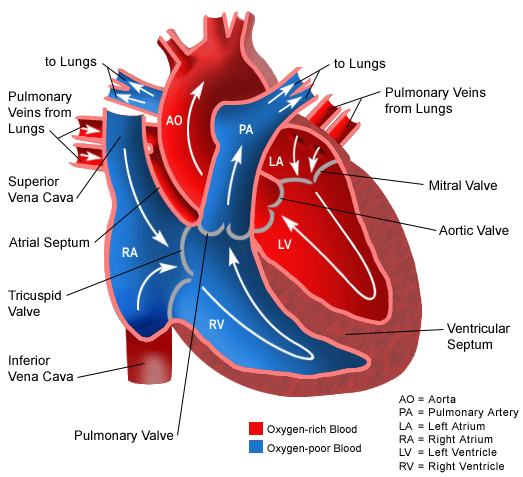
    
 ## Dataset Link 
 
[1] https://bmcmedinformdecismak.biomedcentral.com/articles/10.1186/s12911-020-1023-5#Sec2

[2] https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0181001#sec010
 
 ## Dataset Description
 
 Feature | Explanation | Measurement	| Range
------------- | ------------- |------------- | -------------
Age	|Age of the patient	|Years |	[40,..., 95]
Anaemia	|Decrease of red <br> blood cells or hemoglobin |	Boolean|	0, 1
High blood pressure |	If a patient has hypertension |	Boolean	 |0, 1
Creatinine phosphokinase<br>(CPK) |	Level of the CPK enzyme <br>in the blood |	mcg/L|	[23,..., 7861]
Diabetes|	If the patient has diabetes |	Boolean	| 0, 1
Ejection fraction|	Percentage of blood leaving<br>the heart at each contraction|Percentage	|	[14,..., 80]
Sex	| Woman or man |	Binary|	0, 1
Platelets|	Platelets in the blood|	kiloplatelets/mL|	[25.01,..., 850.00]
Serum creatinine|	Level of creatinine in the blood|	mg/dL|	[0.50,..., 9.40]
Serum sodium|	Level of sodium in the blood|	mEq/L|	[114,..., 148]
Smoking|	If the patient smokes|	Boolean	|0, 1
Time|	Follow-up period|	Days|	[4,...,285]
DEATH EVENT<br>(TARGET)|	If the patient died during the follow-up period|	Boolean|	0, 1

**NOTE: mcg/L: micrograms per liter. mL: microliter. mEq/L: milliequivalents per litre**
 
 ### References
 
    Machine learning can predict survival of patients with heart failure from serum creatinine and 
    ejection fraction alone. (03 February 2020)
   https://doi.org/10.1186/s12911-020-1023-5

### Required Libraries and Utilities

In [3]:
# Import the required libraries
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt 
import seaborn as sns

from sklearn.preprocessing import RobustScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import recall_score, accuracy_score, confusion_matrix, f1_score, matthews_corrcoef
from sklearn.metrics import precision_score, auc, roc_auc_score, roc_curve, precision_recall_curve, classification_report
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier

from scipy.stats import randint 

from imblearn.over_sampling import SMOTE
from collections import Counter

from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

In [4]:
from ReusableUtils import ReusableUtils
utils = ReusableUtils()

### Set Notebook Configuration Parameters 

In [6]:
utils.setNotebookConfigParams()

C:\Users\jemin\Machine Learning Programming\Working Dor Heart-Failure-Condition-And-Survival-Analysis-master - Copy\ReusableUtils.py:59: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



### Utility Functions

### Import Data

In [9]:
heart_faliure_data = pd.read_csv(filepath_or_buffer = './data/heart_failure_clinical_records_dataset.csv', 
                                 low_memory = False, 
                                 skipinitialspace = True, 
                                 float_precision = 'round_trip')

heart_faliure_data.head()

,age,anaemia,creatinine_phosphokinase,diabetes,ejection_fraction,high_blood_pressure,platelets,serum_creatinine,serum_sodium,sex,smoking,time,DEATH_EVENT
0,75.0,0,582,0,20,1,265000.00,1.9,130,1,0,4,1
1,55.0,0,7861,0,38,0,263358.03,1.1,136,1,0,6,1
2,65.0,0,146,0,20,0,162000.00,1.3,129,1,1,7,1
3,50.0,1,111,0,20,0,210000.00,1.9,137,1,0,7,1
4,65.0,1,160,1,20,0,327000.00,2.7,116,0,0,8,1


In [10]:
heart_faliure_data.shape

(299, 13)

In [11]:
# Check the total missing values in each column.
print("Total NULL Values in each columns")
print("*********************************")
print(heart_faliure_data.isnull().sum())

Total NULL Values in each columns
*********************************
age                         0
anaemia                     0
creatinine_phosphokinase    0
diabetes                    0
ejection_fraction           0
high_blood_pressure         0
platelets                   0
serum_creatinine            0
serum_sodium                0
sex                         0
smoking                     0
time                        0
DEATH_EVENT                 0
dtype: int64


***This looks to be a clean dataset without any missing values...***

In [13]:
heart_faliure_data.describe().T

,count,mean,std,min,25%,50%,75%,max
age,299.0,60.833893,11.894809,40.0,51.0,60.0,70.0,95.0
anaemia,299.0,0.431438,0.496107,0.0,0.0,0.0,1.0,1.0
creatinine_phosphokinase,299.0,581.839465,970.287881,23.0,116.5,250.0,582.0,7861.0
diabetes,299.0,0.418060,0.494067,0.0,0.0,0.0,1.0,1.0
ejection_fraction,299.0,38.083612,11.834841,14.0,30.0,38.0,45.0,80.0
high_blood_pressure,299.0,0.351171,0.478136,0.0,0.0,0.0,1.0,1.0
platelets,299.0,263358.029264,97804.236869,25100.0,212500.0,262000.0,303500.0,850000.0
serum_creatinine,299.0,1.393880,1.034510,0.5,0.9,1.1,1.4,9.4
serum_sodium,299.0,136.625418,4.412477,113.0,134.0,137.0,140.0,148.0
sex,299.0,0.648829,0.478136,0.0,0.0,1.0,1.0,1.0


## Data Preparation

### Test - Train Split

In [16]:
# X = heart_faliure_data[['age', 'ejection_fraction', 'serum_creatinine', 'serum_sodium', 
#  'creatinine_phosphokinase']]

# X = heart_faliure_data[['age', 'ejection_fraction','serum_creatinine', 'serum_sodium']] 

X = heart_faliure_data[['ejection_fraction', 'serum_creatinine', 'age']]

# X = heart_faliure_data[['age','ejection_fraction','serum_sodium']]

y = heart_faliure_data[['DEATH_EVENT']]

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.90, test_size = 0.10, random_state = 109)

print("X_Train Shape:", X_train.shape)
print("Y_Train Shape:", y_train.shape)
print("X_Test Shape:", X_test.shape)
print("Y_Test Shape:", y_test.shape)

X_Train Shape: (269, 3)
Y_Train Shape: (269, 1)
X_Test Shape: (30, 3)
Y_Test Shape: (30, 1)


#### Data Value Counts

In [18]:
print('Original dataset shape %s' % Counter(y_train.values.ravel()))

Original dataset shape Counter({0: 186, 1: 83})


#### <font color = brown>Data Insight 17:</font>

**`1. As we see in the training data, the number of 1s (83 - Death Event) are much less comapred to the number of 0s (171 - Survival Case). This is also confirmed in the Data Insight 15.`**

**`2. With this imbalance dataset (67.89% survival cases & 32.11% death events), the model could become more inclined towards learnign and predicting the negative examples than the positive (death) cases.`**

**`3. To avoid this scenario and create an un-biased model, the dataset should be balanced where we need to generate more  examples of the minority class. We will apply the Synthetic Minority Oversampling Technique (SMOTE) algorithm on the training data such that more examples of the death events are generated and we have a balanced dataset.`**

In [20]:
print('Original dataset shape %s' % Counter(y_train.values.ravel()))

Original dataset shape Counter({0: 186, 1: 83})


In [21]:
data_features = dict(enumerate(X.columns))
data_features

{0: 'ejection_fraction', 1: 'serum_creatinine', 2: 'age'}

#### Synthetic Minority Oversampling Technique (SMOTE)

In [23]:
# Implement SMOTE
sampling = SMOTE(random_state = 100)
X_train, y_train = sampling.fit_resample(X_train.values, y_train.values.ravel())
    
# Shuffle the data
perms = np.random.permutation(X_train.shape[0])
X_train = X_train[perms]
y_train = y_train[perms]

X_train = pd.DataFrame(data = X_train)
y_train = pd.DataFrame(data = y_train)

print(X_train.shape)
print(y_train.shape)

(372, 3)
(372, 1)


In [24]:
print('Resampled dataset shape %s' % Counter(y_train.values.ravel()))
print('Test dataset shape %s' % Counter(y_test.values.ravel()))

Resampled dataset shape Counter({0: 186, 1: 186})
Test dataset shape Counter({0: 17, 1: 13})


#### <font color = brown>Data Balancing Significance</font>

**`1. With the application of SMOTE on the training data, the number of 1s (Death Event) are now equal to the number of 0s (Survival Case) with each 171 records respectively.`**

- **2. This will ensure  -**
    - 2.1 There are equal data points for both positive and negative scenarios and we have a balanced dataset.
    - 2.2 The model will not be biased during training phase by seeing more example of Survival scenarios.


### Data Normalization

In [27]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

## Model Building & Training

To predict patients survival due to heart failure, we will train models from different machine learning algorithms. The classifiers to be used in this study will be -

**`1. Support Vector Machines with RBF kernel`**

**`2. Decision Tree`**

**`3. Random Forest`**

**`4. Gradient Boosting - XGBoost`**

**`5. Light GBM`**

## 1. Support Vector Machines with RBF kernel

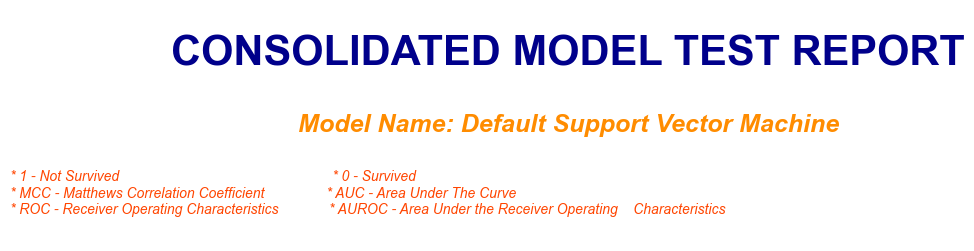

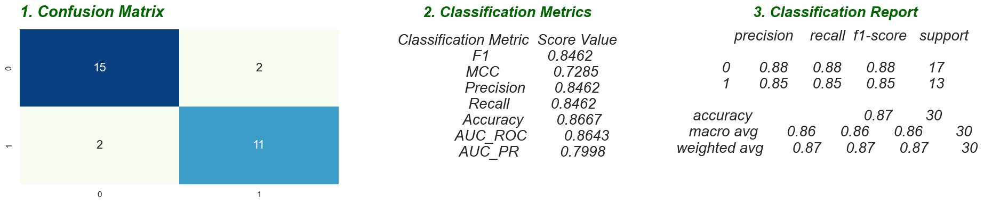

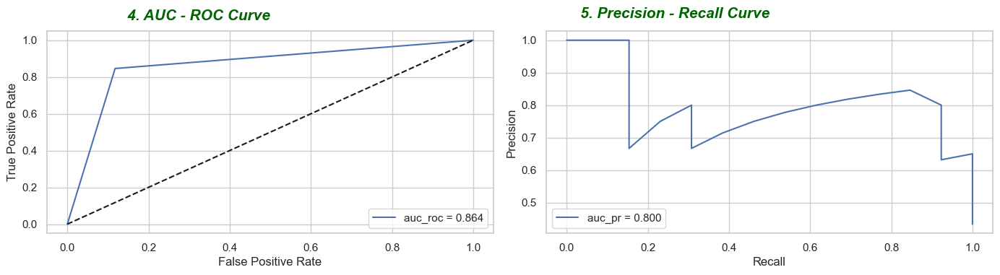

In [29]:
# SVM with Default Parameters and probability = True

svm = SVC(kernel = 'rbf', probability = True, random_state = 100)

svm = svm.fit(X_train, y_train.values.ravel())

# Generate the model test classification report
utils.Generate_Model_Test_Classification_Report(svm, X_test, y_test, model_name="Default Support Vector Machine")

### SVM Hyperparameters Tuning

In [31]:
# GridSearchCV to find best parameters for svm
svm = SVC(kernel = 'rbf', probability = True, random_state = 100)

# parameters to build the model on
param_grid = {'C': [0.1, 1, 10, 100, 1000],  
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001]}  

grid_search = GridSearchCV(estimator = svm, param_grid = param_grid, 
                  scoring = 'accuracy', n_jobs = -1, cv = 5, verbose = 2)

# fitting the model for grid search 
grid_search.fit(X_train, y_train.values.ravel())
    
# get the best parameter from gird search 
print("Best Parameters:", grid_search.best_params_) 
  
# get the best classifier model after hyper-parameter tuning 
print("\nBest Classifier:", grid_search.best_estimator_) 

Fitting 5 folds for each of 25 candidates, totalling 125 fits
Best Parameters: {'C': 10, 'gamma': 1}

Best Classifier: SVC(C=10, gamma=1, probability=True, random_state=100)


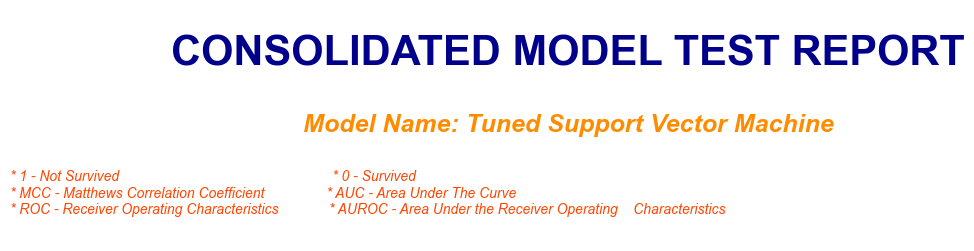

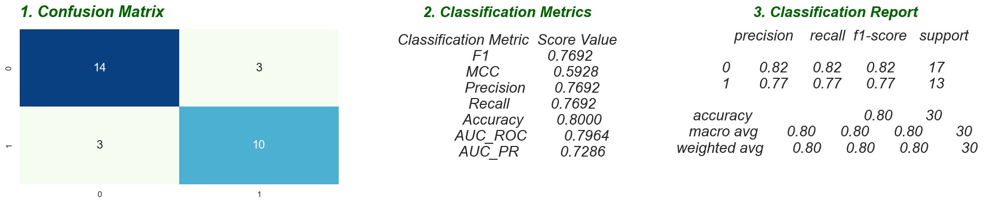

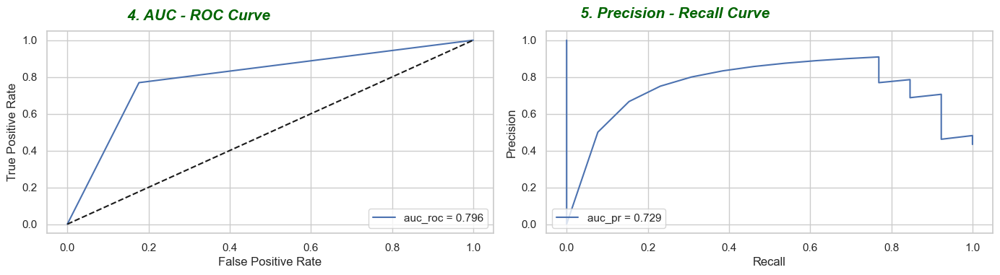

In [32]:
best_svc = grid_search.best_estimator_

best_svc.fit(X_train, y_train.values.ravel())


# Generate the model test classification report
utils.Generate_Model_Test_Classification_Report(best_svc, X_test, y_test, model_name="Tuned Support Vector Machine")

## 2. Decision Tree

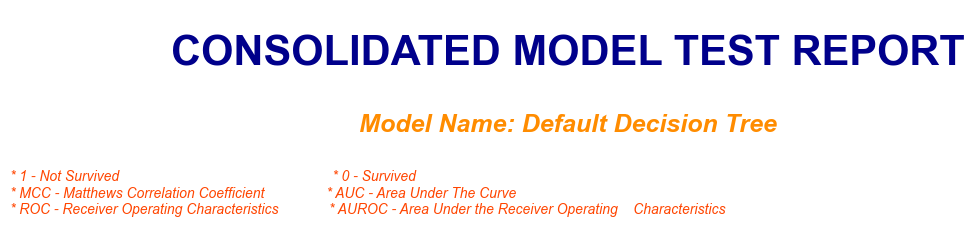

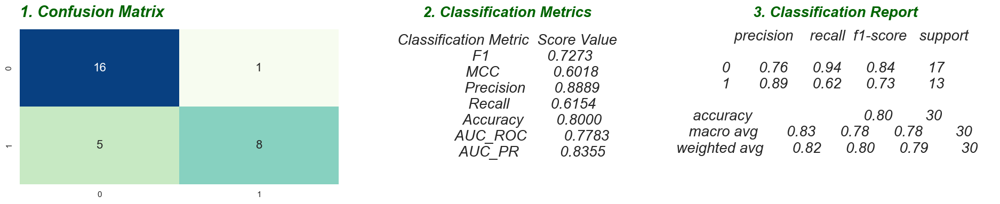

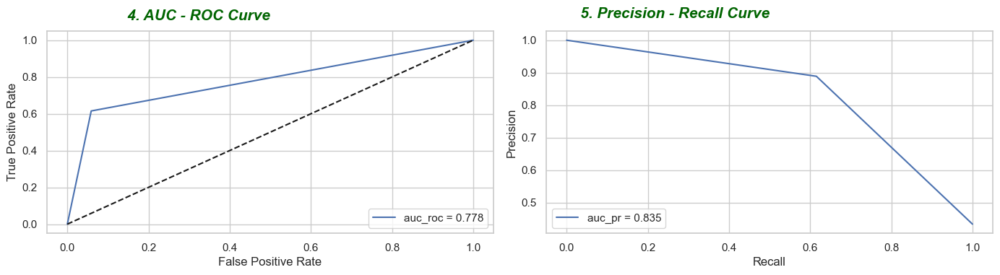

In [34]:
# Decision Tree with Default Parameters

tree = DecisionTreeClassifier(random_state = 100)

tree = tree.fit(X_train, y_train.values.ravel())

# Generate the model test classification report
utils.Generate_Model_Test_Classification_Report(tree, X_test, y_test, model_name="Default Decision Tree")

### Decision Tree Hyperparameters Tuning

In [36]:
# GridSearchCV to find the optimal tree parameters
tree = DecisionTreeClassifier(random_state = 100)

# parameters to build the model on
param_grid = {"max_depth": range(1, 30), 
#               "max_features": randint(1, 9), 
              "min_samples_leaf": randint(1, 9),
              "min_samples_split":range(2, 10),
              "criterion": ["gini", "entropy"]}

# Instantiating RandomizedSearchCV object 
tree_grid = RandomizedSearchCV(tree, param_grid, cv = 5) 
    
# fitting the model for grid search 
tree_grid.fit(X_train, y_train.values.ravel())
    
# get the best parameter from gird search 
print("Best Parameters:", tree_grid.best_params_) 
  
# get the best classifier model after hyper-parameter tuning 
print("\nBest Classifier:", tree_grid.best_estimator_) 

Best Parameters: {'criterion': 'gini', 'max_depth': 9, 'min_samples_leaf': 2, 'min_samples_split': 2}

Best Classifier: DecisionTreeClassifier(max_depth=9, min_samples_leaf=2, random_state=100)


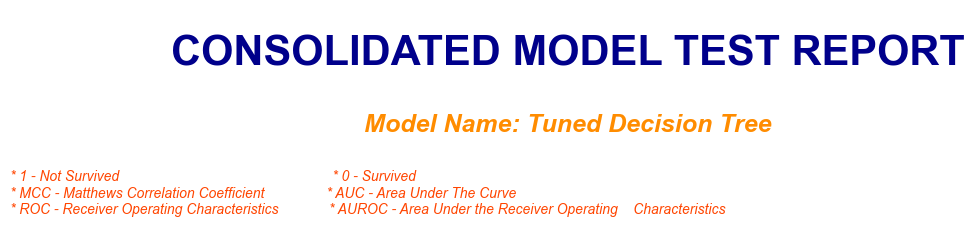

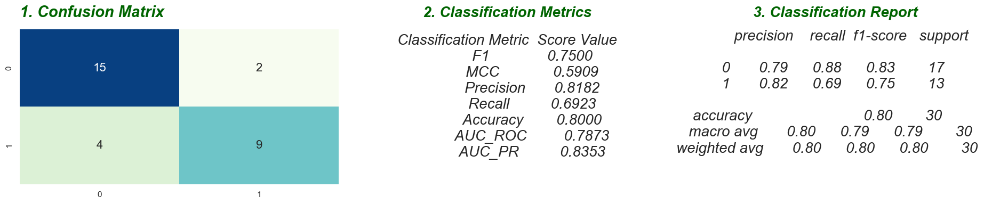

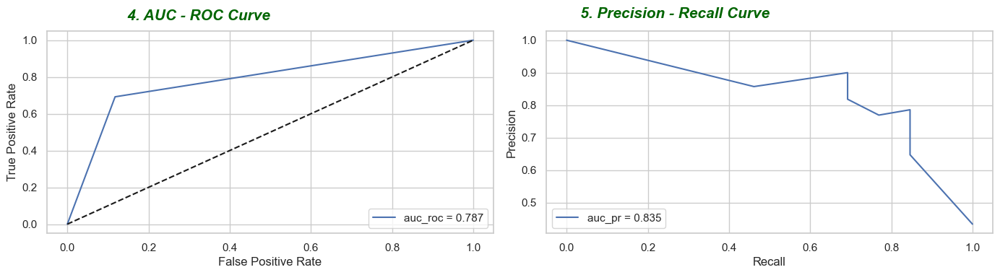

In [37]:
best_tree = tree_grid.best_estimator_

best_tree = best_tree.fit(X_train, y_train.values.ravel())

# Generate the model test classification report
utils.Generate_Model_Test_Classification_Report(best_tree, X_test, y_test, model_name="Tuned Decision Tree")

## 3. Random Forest

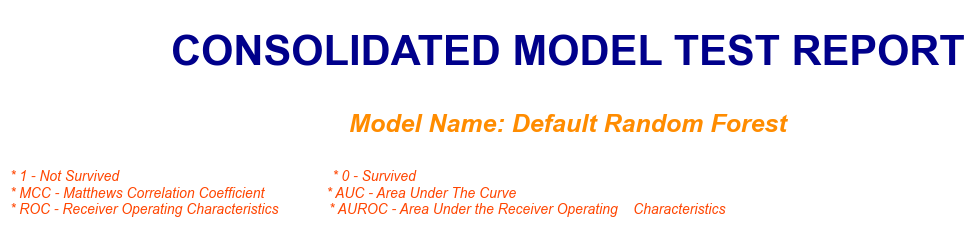

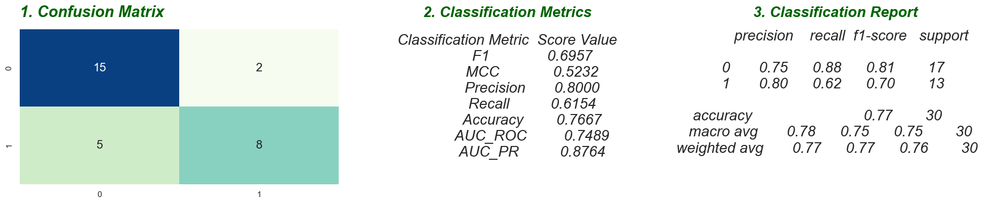

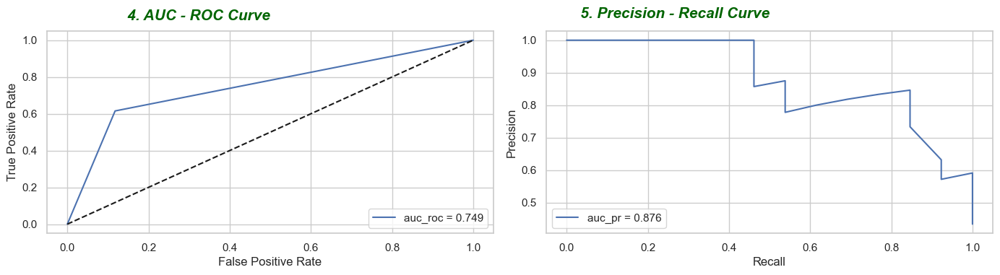

In [39]:
# Random Forest with Default Parameters
rfc = RandomForestClassifier(n_jobs = -1, random_state = 100)

rfc = rfc.fit(X_train, y_train.values.ravel())

# Generate the model test classification report
utils.Generate_Model_Test_Classification_Report(rfc, X_test, y_test, model_name="Default Random Forest")

### Random Forest Hyperparameters Tuning

In [41]:
rn_forest = RandomForestClassifier(n_jobs = -1, random_state = 100)

# parameters to build the model on
param_grid = {"max_depth": range(1, 10), 
#               "max_features": randint(1, 3), 
              "min_samples_leaf": randint(25, 50),
              "min_samples_split":range(50, 100, 2),
              "n_estimators": range(1000, 8000, 500),
              "bootstrap": [True, False]}

# Instantiating RandomizedSearchCV object 
forest_grid = RandomizedSearchCV(rn_forest, param_grid, cv = 5) 
    
# fitting the model for grid search 
forest_grid.fit(X_train, y_train.values.ravel())
    
# get the best parameter from gird search 
print("Best Parameters:", forest_grid.best_params_) 
  
# get the best classifier model after hyper-parameter tuning 
print("\nBest Classifier:", forest_grid.best_estimator_) 

Best Parameters: {'bootstrap': True, 'max_depth': 5, 'min_samples_leaf': 27, 'min_samples_split': 72, 'n_estimators': 5000}

Best Classifier: RandomForestClassifier(max_depth=5, min_samples_leaf=27, min_samples_split=72,
                       n_estimators=5000, n_jobs=-1, random_state=100)


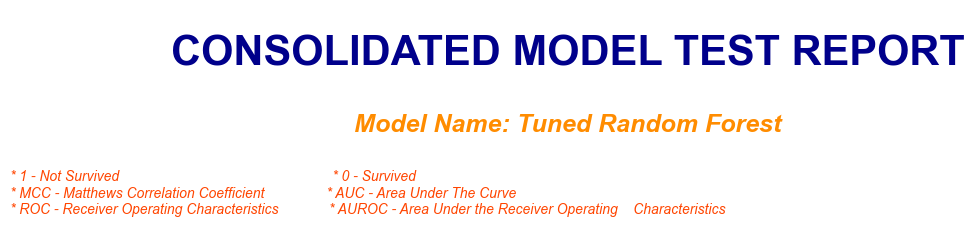

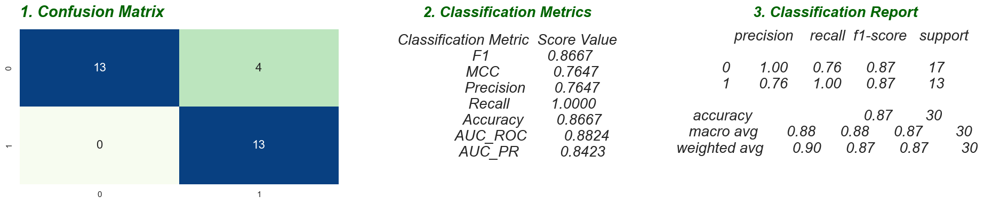

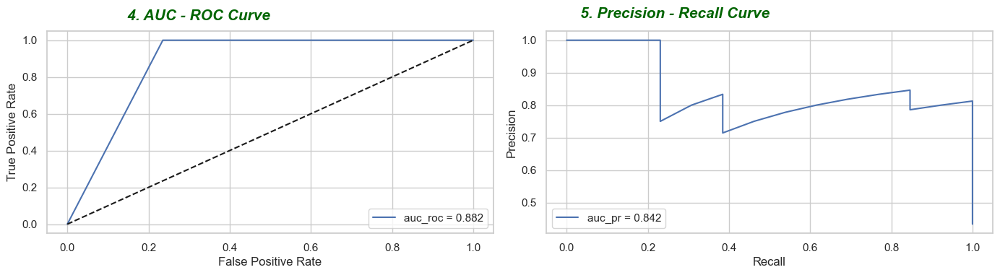

In [42]:
# Random Forest with Best Hypertuned Parameters
best_forest = forest_grid.best_estimator_

best_forest = best_forest.fit(X_train, y_train.values.ravel())

# Generate the model test classification report
utils.Generate_Model_Test_Classification_Report(best_forest, X_test, y_test, model_name="Tuned Random Forest")

## 4. Extreme Gradient Boosting - XGBoost

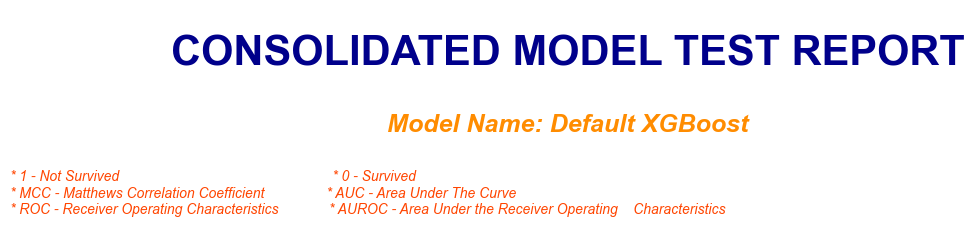

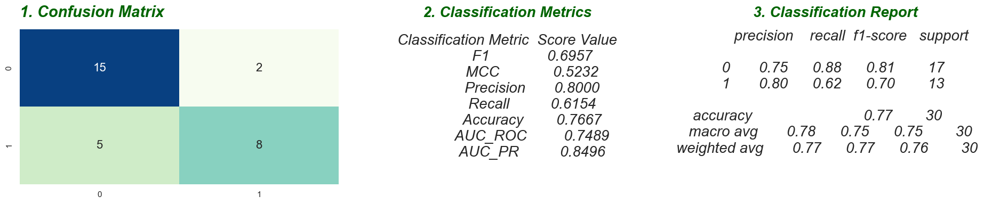

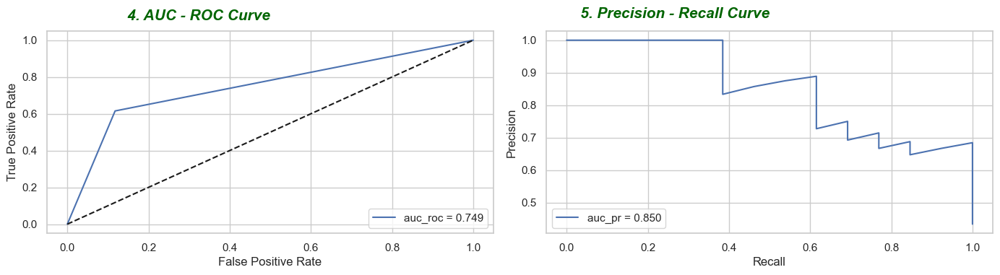

In [44]:
# XGBoost with Default Parameters
xgb = XGBClassifier(n_jobs = -1, random_state = 100)

xgb = xgb.fit(X_train, y_train.values.ravel())

# Generate the model test classification report
utils.Generate_Model_Test_Classification_Report(xgb, X_test, y_test, model_name="Default XGBoost")

In [45]:
# utils.plot_model_feature_importances(X_train, model = xgb)
xgb.feature_importances_

array([0.36654663, 0.35806167, 0.27539167], dtype=float32)

### XG Boost Hyperparameters Tuning

In [47]:
# XGBoost with Default Parameters
xgb = XGBClassifier(n_jobs = -1, random_state = 100)

param_grid = {'max_depth': range(4, 40),
             'learning_rate': [0.001, 0.01, 0.1, 0.2, 0.3, 0.6, 0.9, 0.95, 0.99],
             'n_estimators': range(100, 1100, 100),
             'min_child_weight': range(1, 11),
             'subsample': np.arange(0.1, 1.1, 0.1),
             'colsample_bytree': np.arange(0.1, 1.1, 0.1)}

# Instantiating RandomizedSearchCV object 
xgb_grid = RandomizedSearchCV(xgb, param_grid, cv = 5) 
    
# fitting the model for grid search 
xgb_grid.fit(X_train, y_train.values.ravel())
    
# get the best parameter from gird search 
print("Best Parameters:", xgb_grid.best_params_) 
  
# get the best classifier model after hyper-parameter tuning 
print("\nBest Classifier:", xgb_grid.best_estimator_)

Best Parameters: {'subsample': 0.5, 'n_estimators': 500, 'min_child_weight': 5, 'max_depth': 5, 'learning_rate': 0.2, 'colsample_bytree': 0.4}

Best Classifier: XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.4, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=5, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=500, n_jobs=-1,
              num_parallel_tree=None, random_state=100, ...)


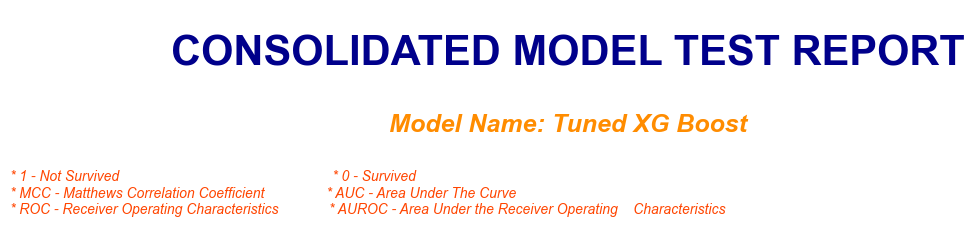

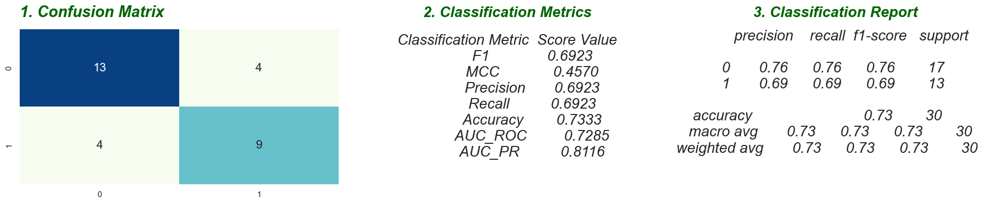

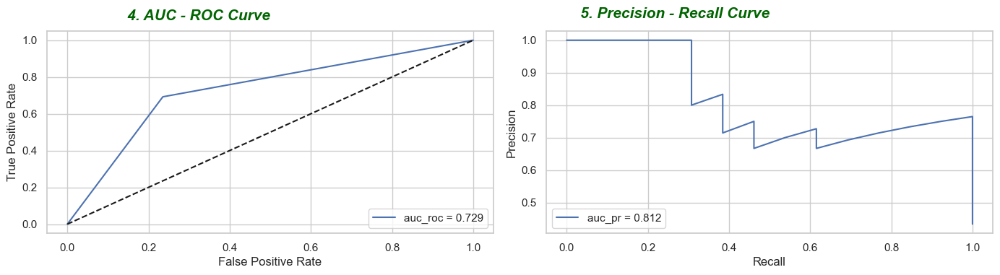

In [48]:
# XG Boost with Best Hypertuned Parameters
best_xgb = xgb_grid.best_estimator_

best_xgb.fit(X_train, y_train.values.ravel())

# Generate the model test classification report
utils.Generate_Model_Test_Classification_Report(best_xgb, X_test, y_test, model_name="Tuned XG Boost")

## 5. Light Gradient Boosted Machine (Light GBM)

[LightGBM] [Info] Number of positive: 186, number of negative: 186
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000369 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 136
[LightGBM] [Info] Number of data points in the train set: 372, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

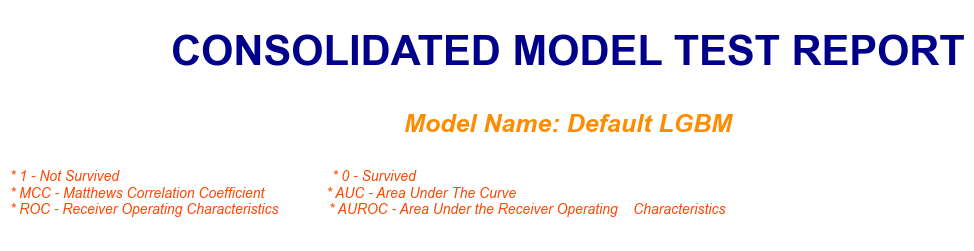

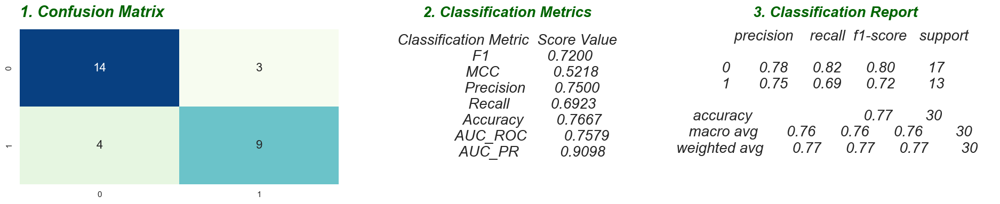

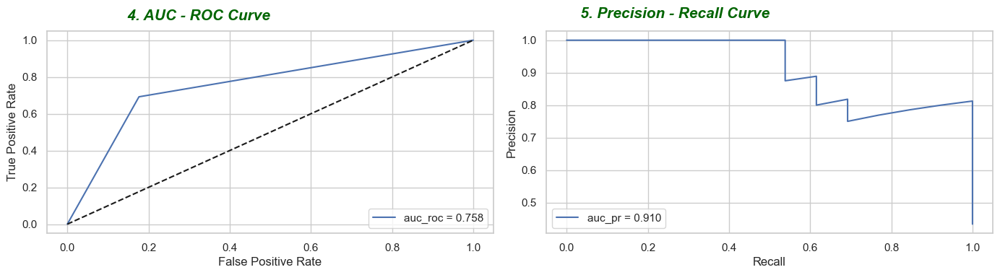

In [50]:
# LightGBM with Default Parameters
lgb = LGBMClassifier(objective = 'binary', n_jobs = -1, random_state = 100)

lgb.fit(X_train, y_train.values.ravel())

# Generate the model test classification report
utils.Generate_Model_Test_Classification_Report(lgb, X_test, y_test, model_name="Default LGBM")

### LGBM Hyperparameter Tuning

In [52]:
# LGBM with Default Parameters
lgb = LGBMClassifier(objective = 'binary', n_jobs = -1, random_state = 100)

param_grid = {'max_depth': range(4, 40),
              'num_leaves': range(20, 100),
              'learning_rate': np.arange(0.1, 1.0, 0.1),
              'n_estimators': range(100, 1100, 100),
              'min_child_samples': range(1, 72),
              'subsample': np.arange(0.1, 1.1, 0.1),
              'colsample_bytree': np.arange(0.1, 1.1, 0.1)}

# Instantiating RandomizedSearchCV object 
lgb_grid= RandomizedSearchCV(lgb, param_grid, cv = 5) 
    
# fitting the model for grid search 
lgb_grid = lgb_grid.fit(X_train, y_train.values.ravel())
    
# get the best parameter from gird search 
print("Best Parameters:", lgb_grid.best_params_) 
  
# get the best classifier model after hyper-parameter tuning 
print("\nBest Classifier:", lgb_grid.best_estimator_)

[LightGBM] [Info] Number of positive: 149, number of negative: 148
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000041 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 112
[LightGBM] [Info] Number of data points in the train set: 297, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.501684 -> initscore=0.006734
[LightGBM] [Info] Start training from score 0.006734
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

### 

[LightGBM] [Info] Number of positive: 186, number of negative: 186
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000049 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 136
[LightGBM] [Info] Number of data points in the train set: 372, number of used features: 3
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

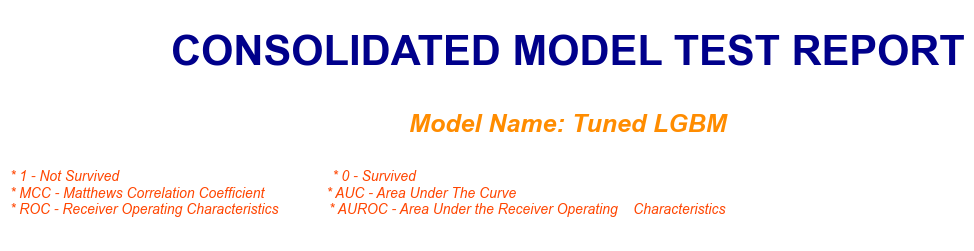

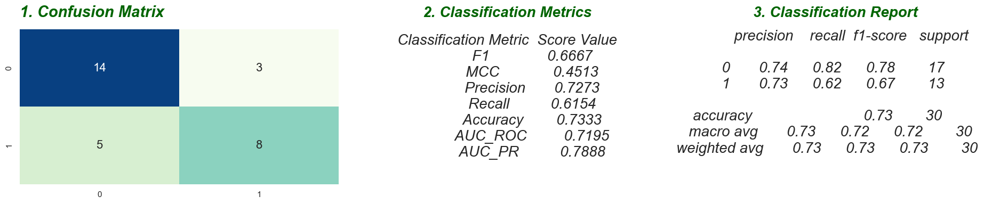

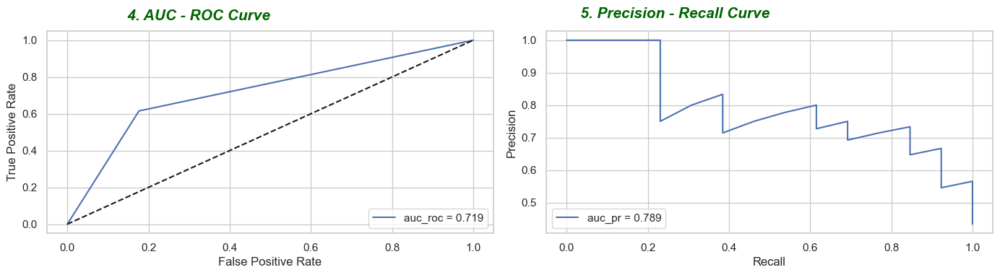

In [54]:
# LGBM with Best Hypertuned Parameters
best_lgb = lgb_grid.best_estimator_

best_lgb.fit(X_train, y_train.values.ravel())

# Generate the model test classification report
utils.Generate_Model_Test_Classification_Report(best_lgb, X_test, y_test, model_name="Tuned LGBM")

**`The above chart shows the impact of the features on the model's output for each class.`**

# Inferences

**`1. 'age', 'ejection_fraction', 'serum_creatinine', 'serum_sodium', 'time' seem to be the features that are more closely related to the death event.`**

**`2. The event of a heart failure in the old age could be fatal.`**

**`3. The levels of 'ejection_fraction', 'serum_creatinine', 'serum_sodium' play an important role in the event of heart failure or the abnormalities in the levels of these become an important factor in triggerring heart failure condition.`**

**`4. Random Forest, XGBoost and LightGBM turn out to be the better models in predicting the event of death given the vital parameters that effect heart failure of Cardiovascular conditions.`**

**`5. Machine Learning models can prove to be a time saving factor in predicting the event of death and can help the doctors take additional precauionary measures with critical care.`**

**`6. The imbalance in the dataset had been dealt using the SMOTE oversampling of the minority class. SMOTE balanced the no. of instances for each class but the amount of data is still limited.`**

**`7. The accuracy and model performance can be increased as more data is collected and made available for the model to train on. This data limitation, limits the model performance to some extent. As more and more data becomes available, the prediction accuracy and model's ability to act on other similar real-time data could be enhanced.`**

# Contribution by using MLP Model (Multiple Linear Perception)

In [58]:
from sklearn.neural_network import MLPClassifier

In [59]:
mlp = MLPClassifier(hidden_layer_sizes=(100,),  # One hidden layer with 100 neurons
                    activation='relu',         # ReLU activation function
                    solver='adam',             # Optimization algorithm (Adam optimizer)
                    max_iter=1000,             # Max number of iterations for convergence
                    random_state=42)

# Train the MLP model
mlp.fit(X_train, y_train)

MLPClassifier(max_iter=1000, random_state=42)

In [60]:
y_pred = mlp.predict(X_test)
print("MLP Model Classification Report:")
print(classification_report(y_test, y_pred))

MLP Model Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.88      0.86        17
           1       0.83      0.77      0.80        13

    accuracy                           0.83        30
   macro avg       0.83      0.83      0.83        30
weighted avg       0.83      0.83      0.83        30



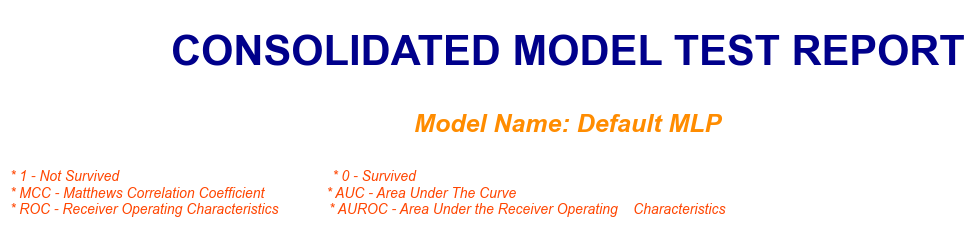

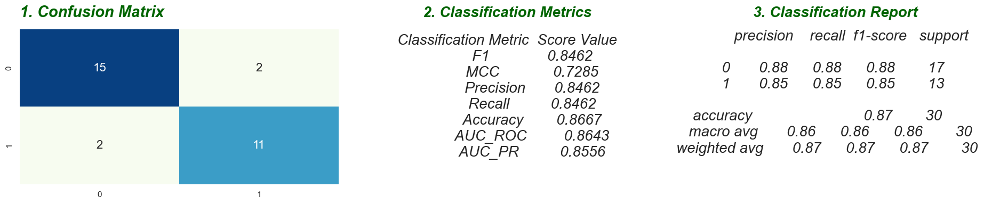

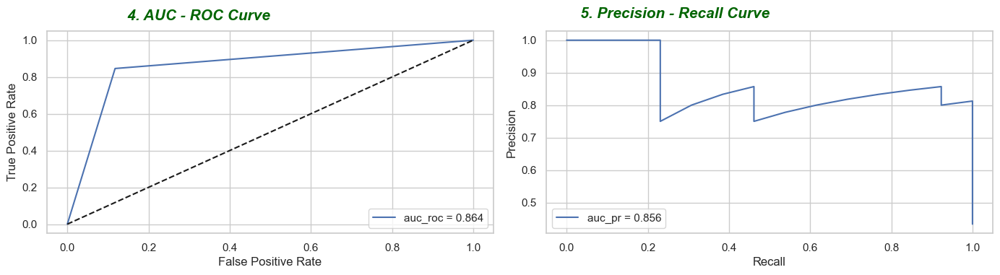

In [199]:
# Random Forest with Default Parameters
mlp = MLPClassifier( random_state = 100)

mlp = mlp.fit(X_train, y_train.values.ravel())

# Generate the model test classification report
utils.Generate_Model_Test_Classification_Report(mlp, X_test, y_test, model_name="Default MLP")

#### Hyperparameter tuning with RandomizedCV

In [64]:
param_grid = {
    'hidden_layer_sizes': [(50,), (100,), (200,), (50, 50), (100, 100)],
    'activation': ['relu', 'tanh', 'logistic'],
    'solver': ['adam', 'sgd'],
    'learning_rate': ['constant', 'adaptive'],
    'max_iter': range(200, 1001, 200),
    'alpha': [0.0001, 0.001, 0.01, 0.1]
}

# Initialize MLPClassifier
mlp = MLPClassifier(random_state=42)

# Instantiate RandomizedSearchCV
random_search = RandomizedSearchCV(mlp, param_distributions=param_grid, 
                                   n_iter=50, cv=5, n_jobs=-1, random_state=42)

# Fit the model with training data
random_search.fit(X_train, y_train)

# Print the best parameters and the best score
print("Best Parameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

Best Parameters: {'solver': 'adam', 'max_iter': 1000, 'learning_rate': 'adaptive', 'hidden_layer_sizes': (200,), 'alpha': 0.1, 'activation': 'relu'}
Best Score: 0.7823783783783783


I tried to tune the model further with additional params but was only able to achieve a 1% growth in accuracy.

In [125]:
param_grid = {
    'hidden_layer_sizes': [(50,), (100,), (200,), (50, 50), (100, 100), (200, 200), (100, 100, 100)],
    'activation': ['relu', 'tanh', 'logistic', 'identity'],  
    'solver': ['adam', 'sgd', 'lbfgs'],  
    'learning_rate': ['constant', 'adaptive', 'invscaling'],  
    'learning_rate_init': [0.001, 0.01, 0.1],  
    'max_iter': range(200, 1501, 200),  
    'alpha': [0.0001, 0.001, 0.01, 0.1, 1.0],  
    'momentum': [0.9, 0.95, 0.99],  
    'early_stopping': [True, False],  
    'validation_fraction': [0.1, 0.2, 0.3],  
    'beta_1': [0.9, 0.95, 0.99], 
    'beta_2': [0.999, 0.98, 0.9]  
}

mlp = MLPClassifier(random_state=42)

random_search = RandomizedSearchCV(mlp, param_distributions=param_grid, 
                                   n_iter=100, cv=5, n_jobs=-1, random_state=42, verbose=2)

random_search.fit(X_train, y_train)

print("Best Parameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

best_model = random_search.best_estimator_
y_pred = best_model.predict(X_test)
print("Test Accuracy:", accuracy_score(y_test, y_pred))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best Parameters: {'validation_fraction': 0.3, 'solver': 'lbfgs', 'momentum': 0.95, 'max_iter': 600, 'learning_rate_init': 0.1, 'learning_rate': 'invscaling', 'hidden_layer_sizes': (50,), 'early_stopping': True, 'beta_2': 0.98, 'beta_1': 0.99, 'alpha': 0.0001, 'activation': 'tanh'}
Best Score: 0.7905225225225225
Test Accuracy: 0.7333333333333333


Best Estimator: MLPClassifier(alpha=0.1, hidden_layer_sizes=(200,), learning_rate='adaptive',
              max_iter=1000, random_state=42)


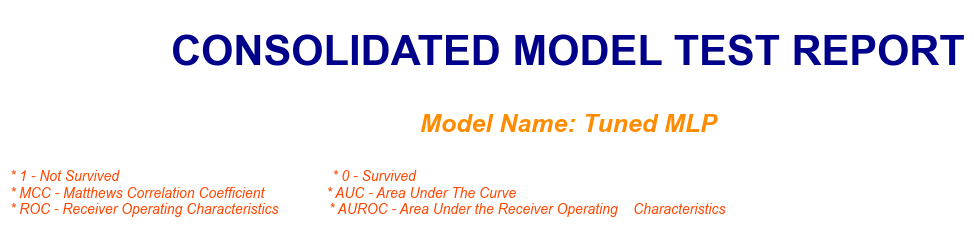

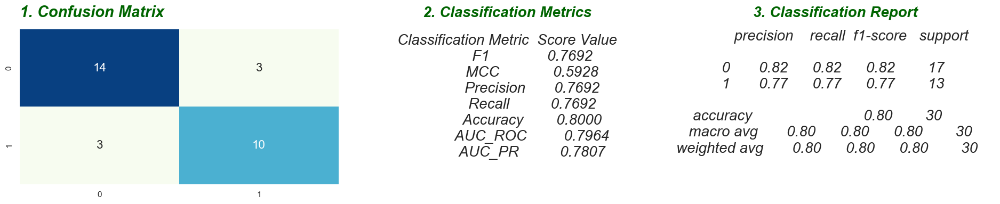

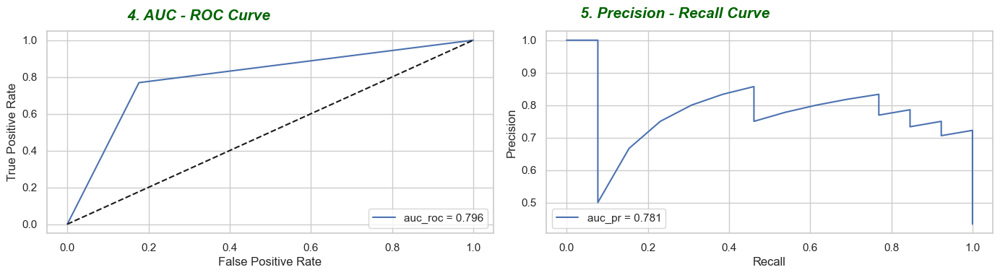

In [65]:
random_search.fit(X_train, y_train)
print("Best Estimator:", random_search.best_estimator_)

best_mlp = random_search.best_estimator_
best_mlp.fit(X_train, y_train)

utils.Generate_Model_Test_Classification_Report(best_mlp, X_test, y_test, model_name="Tuned MLP")


#### Feature importance

<Figure size 1000x600 with 0 Axes>

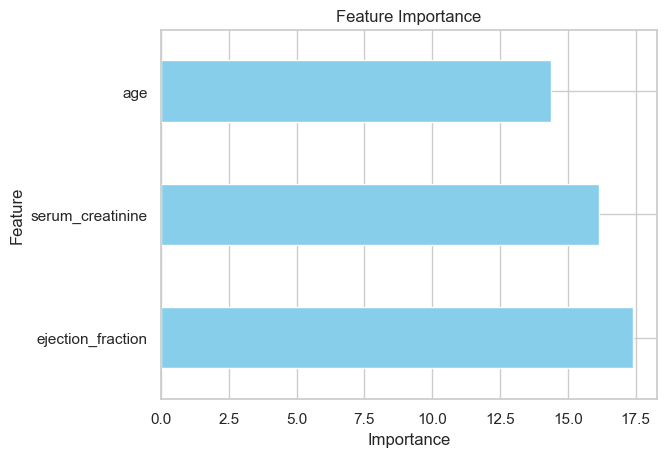

In [201]:
feature_importances = mlp.coefs_[0]  

feature_importance_scores = abs(feature_importances).sum(axis=1)

importances_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importance_scores})
importances_df = importances_df.sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
importances_df.plot(kind='barh', x='Feature', y='Importance', legend=False, color='skyblue')
plt.title('Feature Importance')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

## LIME (Local Interpretable Model-agnostic Explanations) chart 

In [194]:
from lime.lime_tabular import LimeTabularExplainer

explainer = LimeTabularExplainer(X_train, mode='classification', training_labels=y_train.values, random_state=42)

models = {
    "SVC": best_svc,
    "Decision Tree": best_tree,
    "Random Forest": best_forest,
    "XGBoost": best_xgb,
    "LightGBM": best_lgb,
    "MLP": best_mlp
}

for model_name, model in models.items():
    print(f"Generating LIME explanations for {model_name}...")
    explanation = explainer.explain_instance(X_test[0], model.predict_proba)
    explanation.save_to_file(f'{model_name}_lime_explanation.html')
    # To display in the notebook
    explanation.show_in_notebook()

Generating LIME explanations for SVC...


Generating LIME explanations for Decision Tree...


Generating LIME explanations for Random Forest...


Generating LIME explanations for XGBoost...


Generating LIME explanations for LightGBM...


Generating LIME explanations for MLP...


### LIME Explanation for Heart Failure Prediction

**Summary:**
The LIME chart shows how individual features contribute to heart failure prediction across various models (SVC, Decision Tree, Random Forest, XGBoost, LightGBM, MLP).

### Key Insights:
- **Feature Contributions:**
  - **Feature 2 (ejection_fraction) (1.52)**: Strong positive impact on predicting heart failure (highlighted in orange).
  - **Feature 1 (serum_creatine) (0.48)**: Also positively influences heart failure prediction.
  - **Feature 0 (age) (0.06)**: Negatively contributes (blue bar), reducing the probability of heart failure.

### Model Analysis:
- All models consistently predict a high probability of heart failure (class 1), ranging from **0.76** to **1.00**.
- LIME's local explanations help in understanding how each feature affects the predictions, providing transparency and supporting model interpretability.

**Contribution to Analysis:**  
LIME's feature breakdown helps identify which clinical indicators (features) most strongly influence the heart failure diagnosis, guiding both model validation and potential clinical focus areas.



### Ensemble Method vs Random Forest

In [184]:

pred_svc = best_svc.predict_proba(X_train)[:, 1]
pred_tree = best_tree.predict_proba(X_train)[:, 1]
pred_forest = best_forest.predict_proba(X_train)[:, 1]
pred_xgb = best_xgb.predict_proba(X_train)[:, 1]
pred_lgb = best_lgb.predict_proba(X_train)[:, 1]
pred_mlp = best_mlp.predict_proba(X_train)[:, 1]

weights = [0.2, 0.1, 0.3, 0.2, 0.2, 0.1]
final_pred = (weights[0] * pred_svc +
              weights[1] * pred_tree +
              weights[2] * pred_forest +
              weights[3] * pred_xgb +
              weights[4] * pred_lgb +
              weights[5] * pred_mlp)


final_class = (final_pred > 0.5).astype(int)


print("Blended Accuracy:", accuracy_score(y_train, final_class))

report = classification_report(y_train, final_class)
print("\nClassification Report for Ensemble Method:\n", report)

Blended Accuracy: 0.9274193548387096

Classification Report for Ensemble Method:
               precision    recall  f1-score   support

           0       0.95      0.90      0.93       186
           1       0.91      0.95      0.93       186

    accuracy                           0.93       372
   macro avg       0.93      0.93      0.93       372
weighted avg       0.93      0.93      0.93       372



In [175]:
rf_report = classification_report(y_test, y_pred)

print(f"Classification Report for Tuned Random Forest:\n{rf_report}")

Classification Report for Tuned Random Forest:
              precision    recall  f1-score   support

           0       0.70      0.94      0.80        17
           1       0.86      0.46      0.60        13

    accuracy                           0.73        30
   macro avg       0.78      0.70      0.70        30
weighted avg       0.77      0.73      0.71        30



### Comparison of Models for Heart Failure Prediction

The **ensemble method** outperforms the **Tuned Random Forest**, achieving higher accuracy (**92.7%** vs. **73%**), precision, and recall, especially for predicting heart failure cases (the "Survived" class). The ensemble method delivers balanced precision (**95% for class 0, 91% for class 1**) and recall (**90% for class 0, 95% for class 1**) with a weighted F1-score of **93%**. By combining predictions from multiple models, the ensemble method balances individual model weaknesses, ensuring robust and reliable predictions. This makes it particularly suitable for medical applications, where missing a heart failure case could have critical consequences.

On the other hand, the **Tuned Random Forest** performs well in identifying non-heart failure cases (the "Not Survived" class) with **70% precision and 94% recall for class 0**, but it struggles with detecting heart failure cases, achieving only **86% precision and 46% recall for class 1**, resulting in a lower F1-score of **60%** for the "Survived" class. While it is simpler and faster to use, its inconsistency in identifying heart failures limits its reliability in high-stakes scenarios.

**Pros and Cons:**

- **Ensemble Method**:  
  - **Pros**: High accuracy (**92.7%**), balanced predictions, robust for critical applications.  
  - **Cons**: Computationally intensive, more complex to train and interpret.  

- **Tuned Random Forest**:  
  - **Pros**: Simpler, faster, good for "Not Survived" predictions.  
  - **Cons**: Lower recall for heart failure cases, less balanced overall.  

In summary, the ensemble method is better suited for predicting heart failures due to its superior performance, while the Random Forest may be adequate for quicker, less critical tasks.
critical tasks.
